In [25]:
import nltk

In [26]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [3]:
pip install -U textblob

Defaulting to user installation because normal site-packages is not writeable
     -------------------------------------- 636.8/636.8 kB 1.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords
from textblob import TextBlob

# Read Data

In [28]:
data=pd.read_csv("Elon_musk.csv",encoding="latin-1")
data

,Unnamed: 0,Text
0,1,@kunalb11 Im an alien
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,3,@joerogan @Spotify Great interview!
3,4,@gtera27 Doge is underestimated
4,5,@teslacn Congratulations Tesla China for amazi...
...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n..."
1995,1996,@PPathole Make sure to read ur terms &amp; con...
1996,1997,@TeslaGong @PPathole Samwise Gamgee
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...


# Number of words

In [7]:
#Number of Words in single tweet
data['word_count'] = data['Text'].apply(lambda x: len(str(x).split(" ")))
data

,Unnamed: 0,Text,word_count
0,1,@kunalb11 Im an alien,4
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,13
2,3,@joerogan @Spotify Great interview!,4
3,4,@gtera27 Doge is underestimated,4
4,5,@teslacn Congratulations Tesla China for amazi...,17
...,...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n...",23
1995,1996,@PPathole Make sure to read ur terms &amp; con...,12
1996,1997,@TeslaGong @PPathole Samwise Gamgee,4
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...,7


# Number of Characters

In [8]:
#Number of characters in single tweet
data['char_count'] = data['Text'].str.len() ## this also includes spaces
data

,Unnamed: 0,Text,word_count,char_count
0,1,@kunalb11 Im an alien,4,22
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,13,82
2,3,@joerogan @Spotify Great interview!,4,35
3,4,@gtera27 Doge is underestimated,4,31
4,5,@teslacn Congratulations Tesla China for amazi...,17,104
...,...,...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n...",23,144
1995,1996,@PPathole Make sure to read ur terms &amp; con...,12,77
1996,1997,@TeslaGong @PPathole Samwise Gamgee,4,35
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...,7,59


# Average Word Length

In [9]:
def avg_word(sentence):
  words = sentence.split()
  return (sum(len(word) for word in words)/len(words))

data['avg_word'] = data['Text'].apply(lambda x: avg_word(x))
data

,Unnamed: 0,Text,word_count,char_count,avg_word
0,1,@kunalb11 Im an alien,4,22,4.750000
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,13,82,5.384615
2,3,@joerogan @Spotify Great interview!,4,35,8.000000
3,4,@gtera27 Doge is underestimated,4,31,7.000000
4,5,@teslacn Congratulations Tesla China for amazi...,17,104,5.176471
...,...,...,...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n...",23,144,5.260870
1995,1996,@PPathole Make sure to read ur terms &amp; con...,12,77,5.500000
1996,1997,@TeslaGong @PPathole Samwise Gamgee,4,35,8.000000
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...,7,59,7.571429


# Number of stopwords

In [10]:
stop = stopwords.words('english')

data['stopwords'] = data['Text'].apply(lambda x: len([x for x in x.split() if x in stop]))
data

,Unnamed: 0,Text,word_count,char_count,avg_word,stopwords
0,1,@kunalb11 Im an alien,4,22,4.750000,1
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,13,82,5.384615,4
2,3,@joerogan @Spotify Great interview!,4,35,8.000000,0
3,4,@gtera27 Doge is underestimated,4,31,7.000000,1
4,5,@teslacn Congratulations Tesla China for amazi...,17,104,5.176471,5
...,...,...,...,...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n...",23,144,5.260870,11
1995,1996,@PPathole Make sure to read ur terms &amp; con...,12,77,5.500000,2
1996,1997,@TeslaGong @PPathole Samwise Gamgee,4,35,8.000000,0
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...,7,59,7.571429,2


# Number of special Characters

In [11]:
data['numerics'] = data['Text'].apply(lambda x: len([x for x in x.split() if x.isdigit()]))
data

,Unnamed: 0,Text,word_count,char_count,avg_word,stopwords,numerics
0,1,@kunalb11 Im an alien,4,22,4.750000,1,0
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,13,82,5.384615,4,0
2,3,@joerogan @Spotify Great interview!,4,35,8.000000,0,0
3,4,@gtera27 Doge is underestimated,4,31,7.000000,1,0
4,5,@teslacn Congratulations Tesla China for amazi...,17,104,5.176471,5,0
...,...,...,...,...,...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n...",23,144,5.260870,11,0
1995,1996,@PPathole Make sure to read ur terms &amp; con...,12,77,5.500000,2,0
1996,1997,@TeslaGong @PPathole Samwise Gamgee,4,35,8.000000,0,0
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...,7,59,7.571429,2,0


# Number of Upper Case words

In [12]:
data['upper'] = data['Text'].apply(lambda x: len([x for x in x.split() if x.isupper()]))
data

,Unnamed: 0,Text,word_count,char_count,avg_word,stopwords,numerics,upper
0,1,@kunalb11 Im an alien,4,22,4.750000,1,0,0
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...,13,82,5.384615,4,0,1
2,3,@joerogan @Spotify Great interview!,4,35,8.000000,0,0,0
3,4,@gtera27 Doge is underestimated,4,31,7.000000,1,0,0
4,5,@teslacn Congratulations Tesla China for amazi...,17,104,5.176471,5,0,0
...,...,...,...,...,...,...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n...",23,144,5.260870,11,0,0
1995,1996,@PPathole Make sure to read ur terms &amp; con...,12,77,5.500000,2,0,0
1996,1997,@TeslaGong @PPathole Samwise Gamgee,4,35,8.000000,0,0,0
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...,7,59,7.571429,2,0,1


# Pre Processing

# Lower Case

In [13]:
data['Text'] = data['Text'].apply(lambda x: " ".join(x.lower() for x in x.split()))
data

,Unnamed: 0,Text,word_count,char_count,avg_word,stopwords,numerics,upper
0,1,@kunalb11 im an alien,4,22,4.750000,1,0,0
1,2,@id_aa_carmack ray tracing on cyberpunk with h...,13,82,5.384615,4,0,1
2,3,@joerogan @spotify great interview!,4,35,8.000000,0,0,0
3,4,@gtera27 doge is underestimated,4,31,7.000000,1,0,0
4,5,@teslacn congratulations tesla china for amazi...,17,104,5.176471,5,0,0
...,...,...,...,...,...,...,...,...
1994,1995,"@flcnhvy true, it sounds so surreal, but the n...",23,144,5.260870,11,0,0
1995,1996,@ppathole make sure to read ur terms &amp; con...,12,77,5.500000,2,0,0
1996,1997,@teslagong @ppathole samwise gamgee,4,35,8.000000,0,0,0
1997,1998,@ppathole altho dumb and dumber is <u+0001f525...,7,59,7.571429,2,0,1


# Removing Punctuations

In [14]:
data['Text'] = data['Text'].str.replace('[^\w\s]','')
data

C:\Users\Devipriya M Rajesh\AppData\Local\Temp\ipykernel_39252\691413525.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  data['Text'] = data['Text'].str.replace('[^\w\s]','')


,Unnamed: 0,Text,word_count,char_count,avg_word,stopwords,numerics,upper
0,1,kunalb11 im an alien,4,22,4.750000,1,0,0
1,2,id_aa_carmack ray tracing on cyberpunk with hd...,13,82,5.384615,4,0,1
2,3,joerogan spotify great interview,4,35,8.000000,0,0,0
3,4,gtera27 doge is underestimated,4,31,7.000000,1,0,0
4,5,teslacn congratulations tesla china for amazin...,17,104,5.176471,5,0,0
...,...,...,...,...,...,...,...,...
1994,1995,flcnhvy true it sounds so surreal but the nega...,23,144,5.260870,11,0,0
1995,1996,ppathole make sure to read ur terms amp condit...,12,77,5.500000,2,0,0
1996,1997,teslagong ppathole samwise gamgee,4,35,8.000000,0,0,0
1997,1998,ppathole altho dumb and dumber is u0001f525u00...,7,59,7.571429,2,0,1


# Removal of Stop words

In [15]:
stop = stopwords.words('english')
data['Text'] = data['Text'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
data

,Unnamed: 0,Text,word_count,char_count,avg_word,stopwords,numerics,upper
0,1,kunalb11 im alien,4,22,4.750000,1,0,0
1,2,id_aa_carmack ray tracing cyberpunk hdr nextle...,13,82,5.384615,4,0,1
2,3,joerogan spotify great interview,4,35,8.000000,0,0,0
3,4,gtera27 doge underestimated,4,31,7.000000,1,0,0
4,5,teslacn congratulations tesla china amazing ex...,17,104,5.176471,5,0,0
...,...,...,...,...,...,...,...,...
1994,1995,flcnhvy true sounds surreal negative propagand...,23,144,5.260870,11,0,0
1995,1996,ppathole make sure read ur terms amp condition...,12,77,5.500000,2,0,0
1996,1997,teslagong ppathole samwise gamgee,4,35,8.000000,0,0,0
1997,1998,ppathole altho dumb dumber u0001f525u0001f525,7,59,7.571429,2,0,1


# Common word removal

In [16]:
freq = pd.Series(' '.join(data['Text']).split()).value_counts()[:10]
freq

spacex            239
amp               218
tesla             166
erdayastronaut    142
rt                127
ppathole          123
flcnhvy           114
yes                86
great              76
teslaownerssv      73
dtype: int64

In [17]:
freq = list(freq.index)
data['Text'] = data['Text'].apply(lambda x: " ".join(x for x in x.split() if x not in freq))
data

,Unnamed: 0,Text,word_count,char_count,avg_word,stopwords,numerics,upper
0,1,kunalb11 im alien,4,22,4.750000,1,0,0
1,2,id_aa_carmack ray tracing cyberpunk hdr nextle...,13,82,5.384615,4,0,1
2,3,joerogan spotify interview,4,35,8.000000,0,0,0
3,4,gtera27 doge underestimated,4,31,7.000000,1,0,0
4,5,teslacn congratulations china amazing executio...,17,104,5.176471,5,0,0
...,...,...,...,...,...,...,...,...
1994,1995,true sounds surreal negative propaganda still ...,23,144,5.260870,11,0,0
1995,1996,make sure read ur terms conditions clicking ac...,12,77,5.500000,2,0,0
1996,1997,teslagong samwise gamgee,4,35,8.000000,0,0,0
1997,1998,altho dumb dumber u0001f525u0001f525,7,59,7.571429,2,0,1


# Rare words Removal

In [18]:
freq = pd.Series(' '.join(data['Text']).split()).value_counts()[-10:]
freq

nyquil                1
musk                  1
negati                1
httpstco6ohta09s5l    1
carousel              1
joeingeneral          1
andrewbogut           1
typical               1
unusual               1
altho                 1
dtype: int64

In [19]:
freq = list(freq.index)
data['Text'] = data['Text'].apply(lambda x: " ".join(x for x in x.split() if x not in freq))
data

,Unnamed: 0,Text,word_count,char_count,avg_word,stopwords,numerics,upper
0,1,kunalb11 im alien,4,22,4.750000,1,0,0
1,2,id_aa_carmack ray tracing cyberpunk hdr nextle...,13,82,5.384615,4,0,1
2,3,joerogan spotify interview,4,35,8.000000,0,0,0
3,4,gtera27 doge underestimated,4,31,7.000000,1,0,0
4,5,teslacn congratulations china amazing executio...,17,104,5.176471,5,0,0
...,...,...,...,...,...,...,...,...
1994,1995,true sounds surreal negative propaganda still ...,23,144,5.260870,11,0,0
1995,1996,make sure read ur terms conditions clicking ac...,12,77,5.500000,2,0,0
1996,1997,teslagong samwise gamgee,4,35,8.000000,0,0,0
1997,1998,dumb dumber u0001f525u0001f525,7,59,7.571429,2,0,1


# Spelling correction

In [20]:
data['Text'][:5].apply(lambda x: str(TextBlob(x).correct()))

0                                    kunalb11 in alien
1    id_aa_carmack ray tracing cyberpunk her nextle...
2                           joerogan specify interview
3                          gtera27 done underestimated
4    teslacn congratulations china amazing executio...
Name: Text, dtype: object

# Tokenization

In [23]:
nltk.download('punkt')
TextBlob(data['Text'][1]).words

[nltk_data] Downloading package punkt to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


WordList(['id_aa_carmack', 'ray', 'tracing', 'cyberpunk', 'hdr', 'nextlevel', 'tried'])

# Stemming

In [24]:
from nltk.stem import PorterStemmer
st = PorterStemmer()
data['Text'][:5].apply(lambda x: " ".join([st.stem(word) for word in x.split()]))

0                                    kunalb11 im alien
1    id_aa_carmack ray trace cyberpunk hdr nextleve...
2                           joerogan spotifi interview
3                              gtera27 doge underestim
4    teslacn congratul china amaz execut last year ...
Name: Text, dtype: object

# Lemmatization

In [25]:
from textblob import Word

In [27]:
nltk.download('omw-1.4')
data['Text'] = data['Text'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))
data

[nltk_data] Downloading package omw-1.4 to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...


,Unnamed: 0,Text,word_count,char_count,avg_word,stopwords,numerics,upper
0,1,kunalb11 im alien,4,22,4.750000,1,0,0
1,2,id_aa_carmack ray tracing cyberpunk hdr nextle...,13,82,5.384615,4,0,1
2,3,joerogan spotify interview,4,35,8.000000,0,0,0
3,4,gtera27 doge underestimated,4,31,7.000000,1,0,0
4,5,teslacn congratulation china amazing execution...,17,104,5.176471,5,0,0
...,...,...,...,...,...,...,...,...
1994,1995,true sound surreal negative propaganda still e...,23,144,5.260870,11,0,0
1995,1996,make sure read ur term condition clicking accept,12,77,5.500000,2,0,0
1996,1997,teslagong samwise gamgee,4,35,8.000000,0,0,0
1997,1998,dumb dumber u0001f525u0001f525,7,59,7.571429,2,0,1


# Advanced Text Pre Processing

# N-grams

In [28]:
TextBlob(data['Text'][0]).ngrams(2)

[WordList(['kunalb11', 'im']), WordList(['im', 'alien'])]

# Term frequency

In [29]:
tf1 = (data['Text'][1:2]).apply(lambda x: pd.value_counts(x.split(" "))).sum(axis = 0).reset_index()
tf1.columns = ['words','tf']
tf1

,words,tf
0,id_aa_carmack,1
1,ray,1
2,tracing,1
3,cyberpunk,1
4,hdr,1
5,nextlevel,1
6,tried,1


# Inverse Document Frequency

In [30]:
for i,word in enumerate(tf1['words']):
  tf1.loc[i, 'idf'] = np.log(data.shape[0]/(len(data[data['Text'].str.contains(word)])))

tf1

,words,tf,idf
0,id_aa_carmack,1,4.166415
1,ray,1,5.035453
2,tracing,1,7.600402
3,cyberpunk,1,5.115496
4,hdr,1,6.907255
5,nextlevel,1,6.907255
6,tried,1,5.808643


# Term Frequency – Inverse Document Frequency (TF-IDF)

In [31]:
tf1['tfidf'] = tf1['tf'] * tf1['idf']
tf1

,words,tf,idf,tfidf
0,id_aa_carmack,1,4.166415,4.166415
1,ray,1,5.035453,5.035453
2,tracing,1,7.600402,7.600402
3,cyberpunk,1,5.115496,5.115496
4,hdr,1,6.907255,6.907255
5,nextlevel,1,6.907255,6.907255
6,tried,1,5.808643,5.808643


In [32]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(max_features=1000, lowercase=True, analyzer='word',
 stop_words= 'english',ngram_range=(1,1))
vect = tfidf.fit_transform(data['Text'])
vect

<1999x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 7374 stored elements in Compressed Sparse Row format>

# Bag of Words

In [33]:
from sklearn.feature_extraction.text import CountVectorizer
bow = CountVectorizer(max_features=1000, lowercase=True, ngram_range=(1,1),analyzer = "word")
data_bow = bow.fit_transform(data['Text'])
data_bow

<1999x1000 sparse matrix of type '<class 'numpy.int64'>'
	with 8020 stored elements in Compressed Sparse Row format>

# sentimental analysis

In [34]:
data['Text'][:5].apply(lambda x: TextBlob(x).sentiment)

0                                 (-0.25, 0.75)
1                                    (0.0, 0.0)
2                                    (0.0, 0.0)
3                                    (0.0, 0.0)
4    (0.20000000000000004, 0.32222222222222224)
Name: Text, dtype: object

In [35]:
data['sentiment'] = data['Text'].apply(lambda x: TextBlob(x).sentiment[0] )
data[['Text','sentiment']].head()

,Text,sentiment
0,kunalb11 im alien,-0.25
1,id_aa_carmack ray tracing cyberpunk hdr nextle...,0.00
2,joerogan spotify interview,0.00
3,gtera27 doge underestimated,0.00
4,teslacn congratulation china amazing execution...,0.20


In [29]:
em=data.copy()
em

,Unnamed: 0,Text
0,1,@kunalb11 Im an alien
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,3,@joerogan @Spotify Great interview!
3,4,@gtera27 Doge is underestimated
4,5,@teslacn Congratulations Tesla China for amazi...
...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n..."
1995,1996,@PPathole Make sure to read ur terms &amp; con...
1996,1997,@TeslaGong @PPathole Samwise Gamgee
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...


In [30]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud,STOPWORDS
wordnet = WordNetLemmatizer()
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [31]:
em = [Text.strip() for Text in em.Text] # remove both the leading and the trailing characters
em = [Text for Text in em if Text] # removes empty strings, because they are considered in Python as False
em[0:20]

['@kunalb11 I\x92m an alien',
 '@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated',
 '@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!',
 'Happy New Year of the Ox! https://t.co/9WFKMYu2oj',
 'Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM',
 '@OwenSparks_ @flcnhvy @anonyx10 Haha thanks :)',
 '@flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely',
 '@GiveDirectly Just sent some',
 'Just agree to do Clubhouse with @kanyewest',
 'https://t.co/3rWE9uHSTS',
 '@geoffkeighley @UnrealEngine It\x92s getting real',
 'Bought some Dogecoin for lil X, so he can be a toddler hodler',
 '@JoshManMode He definitely has issues, but the sentencing seems a bit high',
 '@freewalletorg Thanks for fixing',

In [32]:
EM_tweet = "".join(em)

In [33]:
import string
import warnings
warnings.filterwarnings('ignore')
import re #regular expression


# Clean The Data using RegEx
#result = re.sub(pattern, repl, string, count=0, flags=0)

def cleantext(text):
    text = re.sub(r"@[A-Za-z0-9]+", "", text) # Remove Mentions
    text = re.sub(r"#", "", text) # Remove Hashtags Symbol
    text = re.sub(r"RT[\s]+", "", text) # Remove Retweets
    text = re.sub(r"https?:\/\/\S+", "", text) # Remove The Hyper Link
    text = re.sub(r"_[A-Za-z0-9]", "", text)#Removing underscores

    
    return text
# Clean The Text
data["Text"] = data["Text"].apply(cleantext)
data.head()

,Unnamed: 0,Text
0,1,Im an alien
1,2,Aarmack Ray tracing on Cyberpunk with HDR is n...
2,3,Great interview!
3,4,Doge is underestimated
4,5,Congratulations Tesla China for amazing execu...


In [34]:
from nltk.tokenize import word_tokenize
text_tokens = word_tokenize(EM_tweet)

In [35]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [36]:
my_stop_words = stopwords.words('english')
my_stop_words.append('the')
no_stop_tokens = [word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens[0:50])

['@', 'kunalb11', 'I\x92m', 'alien', '@', 'ID_AA_Carmack', 'Ray', 'tracing', 'Cyberpunk', 'HDR', 'next-level', '.', 'Have', 'tried', '?', '@', 'joerogan', '@', 'Spotify', 'Great', 'interview', '!', '@', 'gtera27', 'Doge', 'underestimated', '@', 'teslacn', 'Congratulations', 'Tesla', 'China', 'amazing', 'execution', 'last', 'year', '.', 'Now', 'next', 'even', '!', '!', 'Happy', 'New', 'Year', 'Ox', '!', 'https', ':', '//t.co/9WFKMYu2ojFrodo', 'underdoge']


In [37]:
lower_words = [Text.lower() for Text in no_stop_tokens]
print(lower_words[0:50])

['@', 'kunalb11', 'i\x92m', 'alien', '@', 'id_aa_carmack', 'ray', 'tracing', 'cyberpunk', 'hdr', 'next-level', '.', 'have', 'tried', '?', '@', 'joerogan', '@', 'spotify', 'great', 'interview', '!', '@', 'gtera27', 'doge', 'underestimated', '@', 'teslacn', 'congratulations', 'tesla', 'china', 'amazing', 'execution', 'last', 'year', '.', 'now', 'next', 'even', '!', '!', 'happy', 'new', 'year', 'ox', '!', 'https', ':', '//t.co/9wfkmyu2ojfrodo', 'underdoge']


In [38]:
from nltk.stem import PorterStemmer

In [39]:
stemmed_tokens = [PorterStemmer().stem(word) for word in lower_words]
print(stemmed_tokens[0:50])

['@', 'kunalb11', 'i\x92m', 'alien', '@', 'id_aa_carmack', 'ray', 'trace', 'cyberpunk', 'hdr', 'next-level', '.', 'have', 'tri', '?', '@', 'joerogan', '@', 'spotifi', 'great', 'interview', '!', '@', 'gtera27', 'doge', 'underestim', '@', 'teslacn', 'congratul', 'tesla', 'china', 'amaz', 'execut', 'last', 'year', '.', 'now', 'next', 'even', '!', '!', 'happi', 'new', 'year', 'ox', '!', 'http', ':', '//t.co/9wfkmyu2ojfrodo', 'underdog']


In [40]:
EM_tweet = re.sub("[^A-Za-z" "]+"," ",EM_tweet).lower()
EM_tweet =re.sub("[0-9" "]+"," ",EM_tweet)

In [41]:
tweet_rev_words = EM_tweet.split(" ")

In [42]:
tweet_rev_string =" ".join(tweet_rev_words)

In [43]:
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [44]:

stop_words = stopwords.words('english')
tweet_rev_words = [w for w in tweet_rev_words if not w in stop_words]
EM_tweet =" ".join(tweet_rev_words)
EM_tweet

' kunalb alien id aa carmack ray tracing cyberpunk hdr next level tried joerogan spotify great interview gtera doge underestimated teslacn congratulations tesla china amazing execution last year next even happy new year ox https co wfkmyu ojfrodo underdoge thought would fail https co zgxjfdzzrm owensparks flcnhvy anonyx haha thanks flcnhvy anonyx indeed tweets definitely represent real world time allocation entertaining outcome likely givedirectly sent somejust agree clubhouse kanyewesthttps co rwe uhsts geoffkeighley unrealengine getting realbought dogecoin lil x toddler hodler joshmanmode definitely issues sentencing seems bit high freewalletorg thanks fixing freewalletorg please unlock account astrojordy u f u f true power haha https co fc uhqsd freewalletorg crypto wallet give private keys avoided costs freewalletorg app sucksrt spacex nasa selected falcon heavy launch first two elements lunar gateway together one mission https co pwt ajtourville yes blkmdl rationaletienne adamklot

In [45]:
wordcloud_ip = WordCloud(
                      background_color='black',
                      width=2000,
                      height=1400
                     ).generate(EM_tweet)

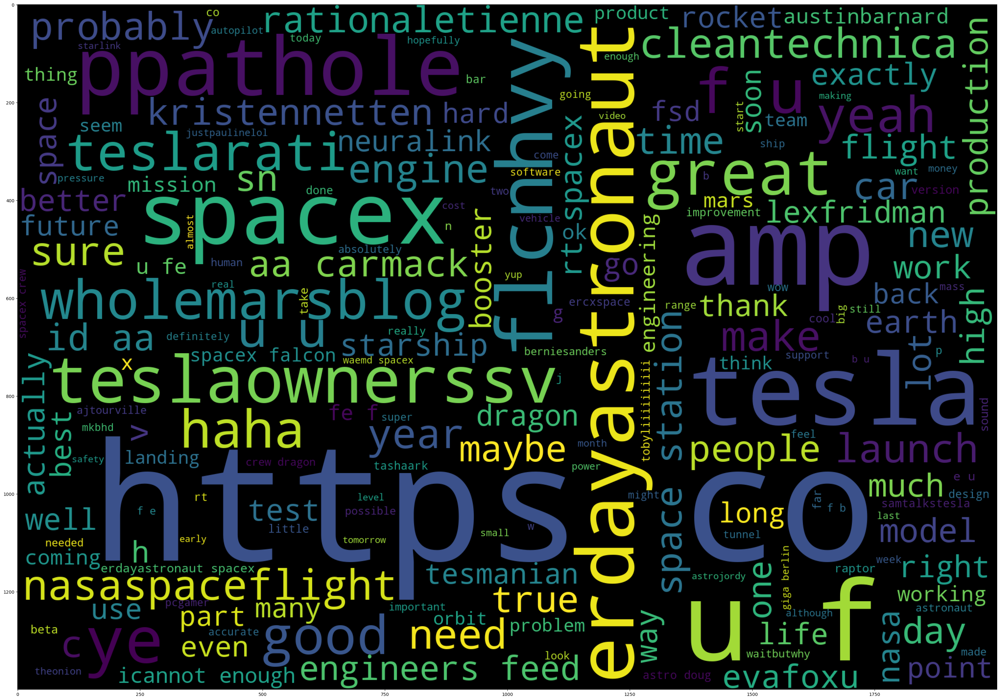

In [46]:
import matplotlib.pyplot as plt
plt.figure(figsize = (40,30))
plt.imshow(wordcloud_ip)

In [47]:
import vaderSentiment
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [48]:
with open(r"C:\Users\Devipriya M Rajesh\Documents\EXCELR\positive-words.txt","r") as pos:
    poswords = pos.read().split("\n")

In [49]:
poswords = poswords[36:]

In [50]:
poswords

['abound',
 'abounds',
 'abundance',
 'abundant',
 'accessable',
 'accessible',
 'acclaim',
 'acclaimed',
 'acclamation',
 'accolade',
 'accolades',
 'accommodative',
 'accomodative',
 'accomplish',
 'accomplished',
 'accomplishment',
 'accomplishments',
 'accurate',
 'accurately',
 'achievable',
 'achievement',
 'achievements',
 'achievible',
 'acumen',
 'adaptable',
 'adaptive',
 'adequate',
 'adjustable',
 'admirable',
 'admirably',
 'admiration',
 'admire',
 'admirer',
 'admiring',
 'admiringly',
 'adorable',
 'adore',
 'adored',
 'adorer',
 'adoring',
 'adoringly',
 'adroit',
 'adroitly',
 'adulate',
 'adulation',
 'adulatory',
 'advanced',
 'advantage',
 'advantageous',
 'advantageously',
 'advantages',
 'adventuresome',
 'adventurous',
 'advocate',
 'advocated',
 'advocates',
 'affability',
 'affable',
 'affably',
 'affectation',
 'affection',
 'affectionate',
 'affinity',
 'affirm',
 'affirmation',
 'affirmative',
 'affluence',
 'affluent',
 'afford',
 'affordable',
 'affordabl

In [51]:
with open(r"C:\Users\Devipriya M Rajesh\Documents\EXCELR\negative-words.txt","r") as neg:
    negwords = neg.read().split("\n")

In [52]:
negwords = negwords[37:]

In [53]:
negwords

['abnormal',
 'abolish',
 'abominable',
 'abominably',
 'abominate',
 'abomination',
 'abort',
 'aborted',
 'aborts',
 'abrade',
 'abrasive',
 'abrupt',
 'abruptly',
 'abscond',
 'absence',
 'absent-minded',
 'absentee',
 'absurd',
 'absurdity',
 'absurdly',
 'absurdness',
 'abuse',
 'abused',
 'abuses',
 'abusive',
 'abysmal',
 'abysmally',
 'abyss',
 'accidental',
 'accost',
 'accursed',
 'accusation',
 'accusations',
 'accuse',
 'accuses',
 'accusing',
 'accusingly',
 'acerbate',
 'acerbic',
 'acerbically',
 'ache',
 'ached',
 'aches',
 'achey',
 'aching',
 'acrid',
 'acridly',
 'acridness',
 'acrimonious',
 'acrimoniously',
 'acrimony',
 'adamant',
 'adamantly',
 'addict',
 'addicted',
 'addicting',
 'addicts',
 'admonish',
 'admonisher',
 'admonishingly',
 'admonishment',
 'admonition',
 'adulterate',
 'adulterated',
 'adulteration',
 'adulterier',
 'adversarial',
 'adversary',
 'adverse',
 'adversity',
 'afflict',
 'affliction',
 'afflictive',
 'affront',
 'afraid',
 'aggravate',

In [54]:
Negative_Tweet= ' '.join([w for w in tweet_rev_words if w in negwords])

In [55]:
wordcloud_neg= WordCloud(
                      background_color='black',
                      width=1800,
                      height=1400
                     ).generate(Negative_Tweet)

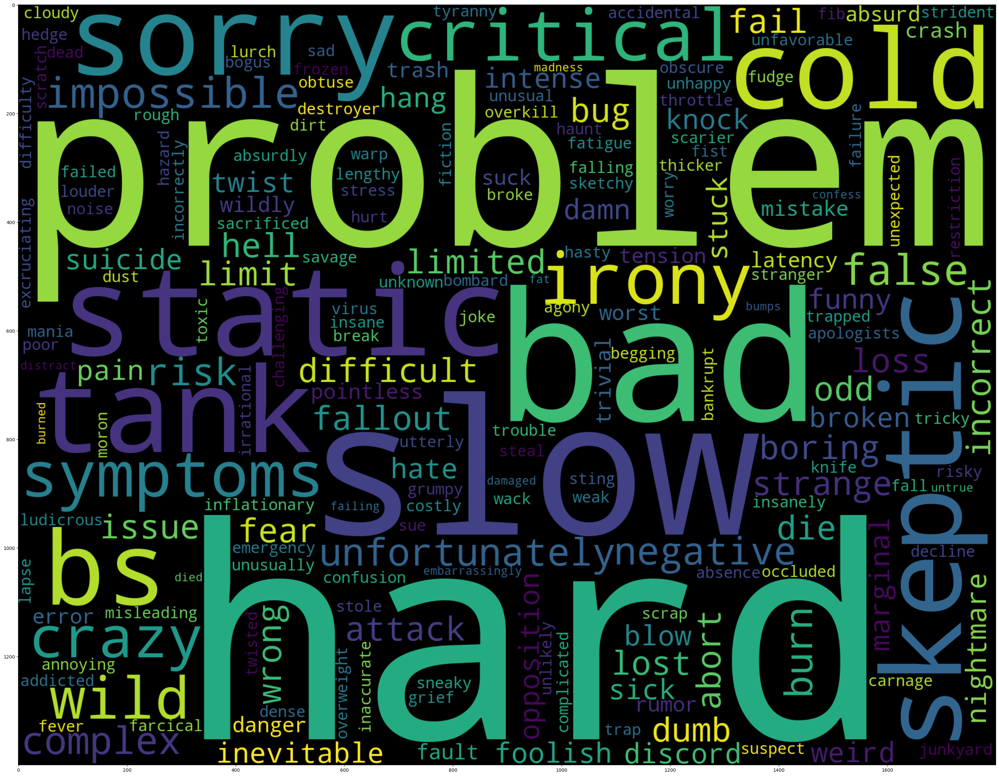

In [56]:
plt.figure(figsize = (40,30))
plt.imshow(wordcloud_neg)

In [57]:
Positive_Tweet = " ".join([w for w in tweet_rev_words if w in poswords])

In [58]:
wordcloud_pos = WordCloud(
                      background_color='black',
                      width=1800,
                      height=1400
                     ).generate(Positive_Tweet)

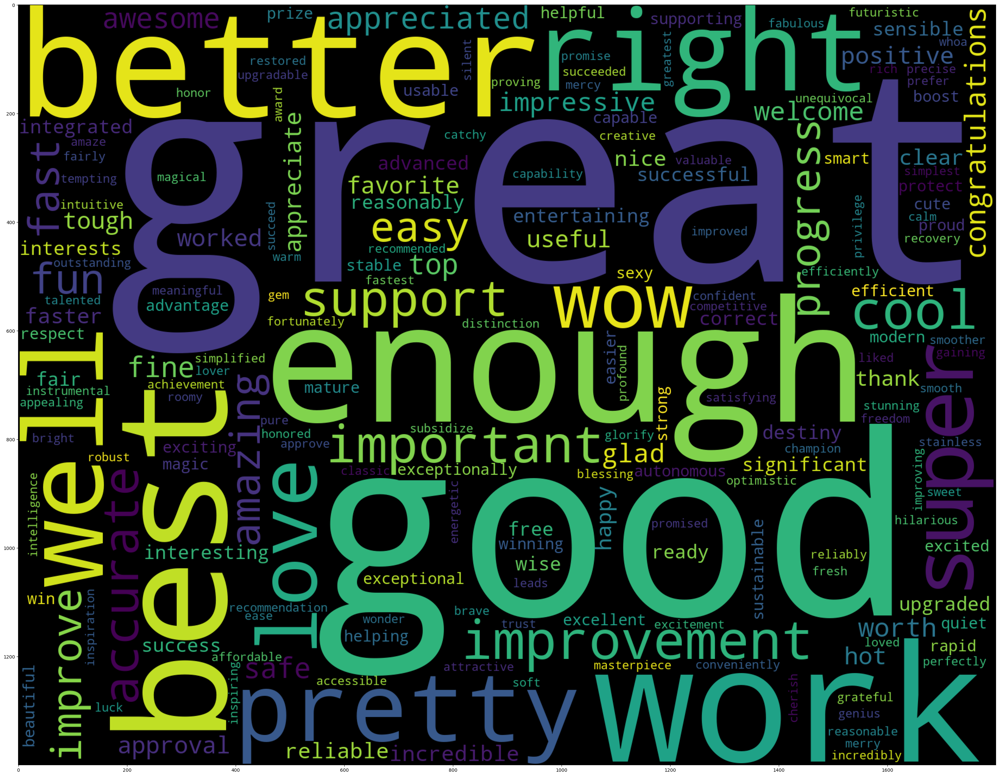

In [59]:
plt.figure(figsize = (40,30))
plt.imshow(wordcloud_pos)

# Perform Emotion mining

# Read Data

In [36]:
! pip install future

Defaulting to user installation because normal site-packages is not writeable


In [37]:
pip install -U future 

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



In [60]:
import codecs
import re
import copy
import collections
import pandas as pd
import numpy as np
import nltk
from nltk.stem import PorterStemmer
from nltk.tokenize import WordPunctTokenizer
import matplotlib
    
%matplotlib inline

In [61]:
from __future__ import division
import os
from nltk.corpus import twitter_samples

In [62]:
from nltk.corpus import stopwords

In [63]:
with codecs.open("positive-words.txt", "r", encoding="utf-8") as p:
    pos = p.read()
    print(pos)

;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;
; 
; Opinion Lexicon: Positive
;
; This file contains a list of POSITIVE opinion words (or sentiment words).
;
; This file and the papers can all be downloaded from 
;    http://www.cs.uic.edu/~liub/FBS/sentiment-analysis.html
;
; If you use this list, please cite one of the following two papers:
;
;   Minqing Hu and Bing Liu. "Mining and Summarizing Customer Reviews." 
;       Proceedings of the ACM SIGKDD International Conference on Knowledge 
;       Discovery and Data Mining (KDD-2004), Aug 22-25, 2004, Seattle, 
;       Washington, USA, 
;   Bing Liu, Minqing Hu and Junsheng Cheng. "Opinion Observer: Analyzing 
;       and Comparing Opinions on the Web." Proceedings of the 14th 
;       International World Wide Web conference (WWW-2005), May 10-14, 
;       2005, Chiba, Japan.
;
; Notes: 
;    1. The appearance of an opinion word in a sentence does not necessarily  
;       mean that the sentence expresse

In [64]:
with codecs.open("negative-words.txt", "r", encoding="ISO-8859-1") as n:
    neg = n.read()
    print(neg)

;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;
; 
; Opinion Lexicon: Negative
;
; This file contains a list of NEGATIVE opinion words (or sentiment words).
;
; This file and the papers can all be downloaded from 
;    http://www.cs.uic.edu/~liub/FBS/sentiment-analysis.html
;
; If you use this list, please cite one of the following two papers:
;
;   Minqing Hu and Bing Liu. "Mining and Summarizing Customer Reviews." 
;       Proceedings of the ACM SIGKDD International Conference on Knowledge 
;       Discovery and Data Mining (KDD-2004), Aug 22-25, 2004, Seattle, 
;       Washington, USA, 
;   Bing Liu, Minqing Hu and Junsheng Cheng. "Opinion Observer: Analyzing 
;       and Comparing Opinions on the Web." Proceedings of the 14th 
;       International World Wide Web conference (WWW-2005), May 10-14, 
;       2005, Chiba, Japan.
;
; Notes: 
;    1. The appearance of an opinion word in a sentence does not necessarily  
;       mean that the sentence expres

In [65]:
with codecs.open("stop.txt", "r", encoding="ISO-8859-1") as s:
    stop = s.read()
    print(stop)

a
a's
able
about
above
according
accordingly
across
actually
after
afterwards
again
against
ain't
all
allow
allows
almost
alone
along
already
also
although
always
am
among
amongst
an
and
another
any
anybody
anyhow
anyone
anything
anyway
anyways
anywhere
apart
appear
appreciate
appropriate
are
aren't
around
as
aside
ask
asking
associated
at
available
away
awfully
b
be
became
because
become
becomes
becoming
been
before
beforehand
behind
being
believe
below
beside
besides
best
better
between
beyond
both
brief
but
by
c
c'mon
c's
came
can
can't
cannot
cant
cause
causes
certain
certainly
changes
clearly
co
com
come
comes
concerning
consequently
consider
considering
contain
containing
contains
corresponding
could
couldn't
course
currently
d
definitely
described
despite
did
didn't
different
do
does
doesn't
doing
don't
done
down
downwards
during
e
each
edu
eg
eight
either
else
elsewhere
enough
entirely
especially
et
etc
even
ever
every
everybody
everyone
everything
everywhere
ex
exactly
example

In [66]:
nltk.download('twitter_samples')

[nltk_data] Downloading package twitter_samples to C:\Users\Devipriya
[nltk_data]     M Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package twitter_samples is already up-to-date!


True

In [67]:
from nltk.corpus import twitter_samples

positive_tweets = twitter_samples.strings('positive_tweets.json')
negative_tweets = twitter_samples.strings('negative_tweets.json')
text = twitter_samples.strings('tweets.20150430-223406.json')

In [68]:
from nltk.corpus import twitter_samples

positive_tweets = twitter_samples.strings('positive_tweets.json')
negative_tweets = twitter_samples.strings('negative_tweets.json')
text = twitter_samples.strings('tweets.20150430-223406.json')
tweet_tokens = twitter_samples.tokenized('positive_tweets.json')[0]

print(tweet_tokens[0])

#FollowFriday


In [69]:
!pip3 install beautifulsoup4

Defaulting to user installation because normal site-packages is not writeable


In [70]:
import pandas as pd
import requests
from tqdm import tqdm_notebook
from bs4 import BeautifulSoup

In [71]:
headers = {
    'authority': 'www.amazon.in',
    'accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9',
    'accept-language': 'en-US,en;q=0.9',
    'cache-control': 'max-age=0',
    # Requests sorts cookies= alphabetically
    # 'cookie': 'session-id=259-3113978-6678618; i18n-prefs=INR; ubid-acbin=260-8554202-6973909; lc-acbin=en_IN; csm-hit=tb:BS866TA0AKH6X86N924E+sa-7XYTQAXQHJP5ADH88228-DY27HYE0CK5V9FW24GBD|1656009294944&t:1656009294945&adb:adblk_yes; session-token=Z1j175VoYxPr2Un/9ciL3Q6lKw+QtLYYIwSQ+GLxjT06952u8vOZromD4WcFE0bs+yrUyLPy8HmIn7mTjUt8qsx3n0meC7yWKFqqwDEm5iecYedklsrNwmDrQOiaMH9lpacbdB8kgUk5IbZdg1VyhrdnY4OZrk6r350ARDEXJExuu2GZr0sV4fpbwUes/V9fDrfASeMQhVEEzmEAAHWN2g==; session-id-time=2082758401l',
    'device-memory': '8',
    'downlink': '10',
    'dpr': '0.8',
    'ect': '4g',
    'referer': 'https://www.amazon.in/OnePlus-Nord-Black-128GB-Storage/dp/B09WQY65HN/ref=sr_1_4?crid=1D99WHM86WX80&keywords=oneplus&qid=1656009113&sprefix=onep%2Caps%2C315&sr=8-4&th=1',
    'rtt': '0',
    'sec-ch-device-memory': '8',
    'sec-ch-dpr': '0.8',
    'sec-ch-ua': '" Not A;Brand";v="99", "Chromium";v="102", "Google Chrome";v="102"',
    'sec-ch-ua-mobile': '?0',
    'sec-ch-ua-platform': '"Windows"',
    'sec-ch-viewport-width': '2400',
    'sec-fetch-dest': 'document',
    'sec-fetch-mode': 'navigate',
    'sec-fetch-site': 'same-origin',
    'sec-fetch-user': '?1',
    'service-worker-navigation-preload': 'true',
    'upgrade-insecure-requests': '1',
    'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/102.0.0.0 Safari/537.36',
    'viewport-width': '2400',
}

In [72]:
def get_soup(url):
    #r = requests.get('http://localhost:8050/render.html', 
    # Run this instead if you haven't setup Splash & Docker
    r = requests.get(url, headers=headers,
    params={'url': url, 'wait': 2})
    soup = BeautifulSoup(r.text, 'html.parser')
    return soup

In [74]:
# Initialize list to store reviews data later on
reviewlist = []

# Function 2: look for web-tags in our soup, then append our data to reviewList
def get_reviews(soup):
    reviews = soup.find_all('div', {'data-hook': 'review'})
    try:
        for item in reviews:
            review = {
            'product': soup.title.text.replace('Amazon.in:Customer reviews: ', '').strip(),    
            'date': item.find('span', {'data-hook': 'review-date'}).text.replace('Reviewed in India on', '').strip(),
            'title': item.find('a', {'data-hook': 'review-title'}).text.strip(),
            'rating':  float(item.find('i', {'data-hook': 'review-star-rating'}).text.replace('out of 5 stars', '').strip()),
            'body': item.find('span', {'data-hook': 'review-body'}).text.strip(),
            }
            reviewlist.append(review)
    except:
        pass

In [75]:
# Initialize list to store reviews data later on
reviewlist = []

# Function 2: look for web-tags in our soup, then append our data to reviewList
def get_reviews(soup):
    reviews = soup.find_all('div', {'data-hook': 'review'})
    try:
        for item in reviews:
            review = {
            'Rating':  float(item.find('i', {'data-hook': 'review-star-rating'}).text.replace('out of 5 stars', '').strip()),
            'Title': item.find('a', {'data-hook': 'review-title'}).text.strip(),
            'Review': item.find('span', {'data-hook': 'review-body'}).text.strip(),
            'Review_Date': item.find('span', {'data-hook': 'review-date'}).text.replace('Reviewed in India on', '').strip(),
            }
            reviewlist.append(review)
    except:
        pass

In [76]:
for x in tqdm_notebook(range(1,1000)):
    soup = get_soup(f'https://www.amazon.in/OnePlus-Nord-Mirror-128GB-Storage/product-reviews/B09RG132Q5/\
    ref=cm_cr_arp_d_paging_btm_next_2?ie=UTF8&reviewerType=all_reviews&pageNumber={x}')
    #print(f'Getting page: {x}')
    get_reviews(soup)
    #print(len(reviewlist))
    if not soup.find('li', {'class': 'a-disabled a-last'}):
        pass
    else:
        break

  0%|          | 0/999 [00:00<?, ?it/s]

In [128]:
# Save results to a dataframe, then export as CSV
df = pd.DataFrame(reviewlist)
df

,Rating,Title,Review,Review_Date
0,4.0,Good phone-could have been better !,I've purchased the 6GB version of this phone w...,Reviewed in India 🇮🇳 on 19 December 2022
1,4.0,A mildly perfect phone,I will try to keep this review short. This rev...,Reviewed in India 🇮🇳 on 12 January 2023
2,4.0,Good to buy one plus brand.,"Its good mobile to purchase, nice mobile , qua...",Reviewed in India 🇮🇳 on 9 May 2023
3,4.0,Handy and light weight,"Phone is handy and light weight, OS is smooth,...",Reviewed in India 🇮🇳 on 8 May 2023
4,4.0,Quality,Ya I like it let's see how long does it works,Reviewed in India 🇮🇳 on 7 May 2023
...,...,...,...,...
4995,4.0,Best 👍,,Reviewed in India 🇮🇳 on 4 June 2022
4996,3.0,Average,Disappointed as a one plus brand,Reviewed in India 🇮🇳 on 16 August 2022
4997,5.0,Good,Superb sensors superb sound,Reviewed in India 🇮🇳 on 7 November 2022
4998,3.0,Only for OnePlus brand,Overall good phone....but cost is little more ...,Reviewed in India 🇮🇳 on 16 June 2022


In [129]:
df.to_csv(r"C:\Users\Devipriya M Rajesh\Documents\EXCELR\Amazon_Reviews_Oneplus_Nord_CE2.csv")

In [130]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import re
import time
import string
import warnings
from tqdm.notebook import tqdm_notebook

# for all NLP related operations on text
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import *
from nltk.classify import NaiveBayesClassifier
from nltk.stem.porter import PorterStemmer
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
from collections import Counter

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, confusion_matrix, accuracy_score, classification_report
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

# To identify the sentiment of text
from textblob import TextBlob
from textblob.sentiments import NaiveBayesAnalyzer
from textblob.np_extractors import ConllExtractor

from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.pipeline import make_pipeline
from nltk.tokenize import RegexpTokenizer

# ignoring all the warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# downloading stopwords corpus
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('vader_lexicon')
nltk.download('averaged_perceptron_tagger')
nltk.download('movie_reviews')
nltk.download('punkt')
nltk.download('conll2000')
nltk.download('brown')
stopwords = set(stopwords.words("english"))

# for showing all the plots inline
%matplotlib inline

[nltk_data] Downloading package stopwords to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package vader_lexicon to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package movie_reviews to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!
[nltk_data] Downloading package punkt to C:\Users\Devi

In [131]:
# load the dataset
reviews=pd.read_csv(r"C:\Users\Devipriya M Rajesh\Documents\EXCELR\Amazon_Reviews_Oneplus_Nord_CE2.csv")
reviews.drop(['Unnamed: 0'],inplace=True,axis=1)
reviews

,Rating,Title,Review,Review_Date
0,4.0,Good phone-could have been better !,I've purchased the 6GB version of this phone w...,Reviewed in India 🇮🇳 on 19 December 2022
1,4.0,A mildly perfect phone,I will try to keep this review short. This rev...,Reviewed in India 🇮🇳 on 12 January 2023
2,4.0,Good to buy one plus brand.,"Its good mobile to purchase, nice mobile , qua...",Reviewed in India 🇮🇳 on 9 May 2023
3,4.0,Handy and light weight,"Phone is handy and light weight, OS is smooth,...",Reviewed in India 🇮🇳 on 8 May 2023
4,4.0,Quality,Ya I like it let's see how long does it works,Reviewed in India 🇮🇳 on 7 May 2023
...,...,...,...,...
4995,4.0,Best 👍,NaN,Reviewed in India 🇮🇳 on 4 June 2022
4996,3.0,Average,Disappointed as a one plus brand,Reviewed in India 🇮🇳 on 16 August 2022
4997,5.0,Good,Superb sensors superb sound,Reviewed in India 🇮🇳 on 7 November 2022
4998,3.0,Only for OnePlus brand,Overall good phone....but cost is little more ...,Reviewed in India 🇮🇳 on 16 June 2022


In [132]:
reviews.Rating.describe()

count    5000.000000
mean        4.112600
std         0.889989
min         1.000000
25%         4.000000
50%         4.000000
75%         5.000000
max         5.000000
Name: Rating, dtype: float64

# Number of words

In [133]:
reviews['word_count'] = reviews['Review'].apply(lambda x: len(str(x).split(" ")))
reviews[['Review','word_count']].head()

,Review,word_count
0,I've purchased the 6GB version of this phone w...,299
1,I will try to keep this review short. This rev...,216
2,"Its good mobile to purchase, nice mobile , qua...",24
3,"Phone is handy and light weight, OS is smooth,...",23
4,Ya I like it let's see how long does it works,11


# Number of characters

In [134]:
reviews['char_count'] = reviews['Review'].str.len() ## this also includes spaces
reviews[['Review','char_count']].head()

,Review,char_count
0,I've purchased the 6GB version of this phone w...,1715.0
1,I will try to keep this review short. This rev...,1189.0
2,"Its good mobile to purchase, nice mobile , qua...",133.0
3,"Phone is handy and light weight, OS is smooth,...",115.0
4,Ya I like it let's see how long does it works,45.0


# Average word length

In [135]:
def avg_word(sentence):
  words = str(sentence).split()
  return (sum(len(word) for word in words)/len(words))

reviews['avg_word'] = reviews['Review'].apply(lambda x: avg_word(x))
reviews[['Review','avg_word']].head()

,Review,avg_word
0,I've purchased the 6GB version of this phone w...,4.755034
1,I will try to keep this review short. This rev...,4.509259
2,"Its good mobile to purchase, nice mobile , qua...",4.583333
3,"Phone is handy and light weight, OS is smooth,...",4.043478
4,Ya I like it let's see how long does it works,3.181818


# Number of stop words

In [136]:
from nltk.corpus import stopwords
stop = stopwords.words('english')

reviews['stopwords'] = reviews['Review'].apply(lambda x: len([x for x in str(x).split() if x in stop]))
reviews[['Review','stopwords']].head()

,Review,stopwords
0,I've purchased the 6GB version of this phone w...,128
1,I will try to keep this review short. This rev...,94
2,"Its good mobile to purchase, nice mobile , qua...",5
3,"Phone is handy and light weight, OS is smooth,...",9
4,Ya I like it let's see how long does it works,4


# Number of special characters

In [137]:
reviews['hashtags'] = reviews['Review'].apply(lambda x: len([x for x in str(x).split() if x.startswith('#')]))
reviews[['Review','hashtags']].head()

,Review,hashtags
0,I've purchased the 6GB version of this phone w...,0
1,I will try to keep this review short. This rev...,0
2,"Its good mobile to purchase, nice mobile , qua...",0
3,"Phone is handy and light weight, OS is smooth,...",0
4,Ya I like it let's see how long does it works,0


# Number of numerics

In [138]:
reviews['numerics'] = reviews['Review'].apply(lambda x: len([x for x in str(x).split() if x.isdigit()]))
reviews[['Review','numerics']].head()

,Review,numerics
0,I've purchased the 6GB version of this phone w...,2
1,I will try to keep this review short. This rev...,0
2,"Its good mobile to purchase, nice mobile , qua...",1
3,"Phone is handy and light weight, OS is smooth,...",0
4,Ya I like it let's see how long does it works,0


# Number of Upper Case words

In [139]:
reviews['upper'] = reviews['Review'].apply(lambda x: len([x for x in str(x).split() if x.isupper()]))
reviews[['Review','upper']].head()

,Review,upper
0,I've purchased the 6GB version of this phone w...,4
1,I will try to keep this review short. This rev...,3
2,"Its good mobile to purchase, nice mobile , qua...",0
3,"Phone is handy and light weight, OS is smooth,...",1
4,Ya I like it let's see how long does it works,1


In [140]:
reviews.drop(['numerics','hashtags','stopwords','avg_word','char_count','word_count','upper'],axis=1,inplace=True)

In [141]:
from textblob import TextBlob
reviews['Review'][:5].apply(lambda x: str(TextBlob(x).correct()))

0    I've purchased the 6GB version of this phone w...
1    I will try to keep this review short. His revi...
2    Its good mobile to purchase, nice mobile , qua...
3    Shone is handy and light weight, of is smooth,...
4         A I like it let's see how long does it works
Name: Review, dtype: object

# Feature Engineering

In [142]:
print(reviews['Review_Date'].str.split(' ').str[0],'\n',
      reviews['Review_Date'].str.split(' ').str[1],'\n',
      reviews['Review_Date'].str.split(' ').str[2])

0       Reviewed
1       Reviewed
2       Reviewed
3       Reviewed
4       Reviewed
          ...   
4995    Reviewed
4996    Reviewed
4997    Reviewed
4998    Reviewed
4999    Reviewed
Name: Review_Date, Length: 5000, dtype: object 
 0       in
1       in
2       in
3       in
4       in
        ..
4995    in
4996    in
4997    in
4998    in
4999    in
Name: Review_Date, Length: 5000, dtype: object 
 0       India
1       India
2       India
3       India
4       India
        ...  
4995    India
4996    India
4997    India
4998    India
4999    India
Name: Review_Date, Length: 5000, dtype: object


# Spliting Review Date into Three seperate Columns (Year,Month,Day)

In [143]:
df=reviews.copy()
df['Date']=df['Review_Date'].str.split(' ').str[0]
df['Month']=df['Review_Date'].str.split(' ').str[1]
df['Year']=df['Review_Date'].str.split(' ').str[2]
df[['Date','Month','Year']]

,Date,Month,Year
0,Reviewed,in,India
1,Reviewed,in,India
2,Reviewed,in,India
3,Reviewed,in,India
4,Reviewed,in,India
...,...,...,...
4995,Reviewed,in,India
4996,Reviewed,in,India
4997,Reviewed,in,India
4998,Reviewed,in,India


In [144]:
df.Month.value_counts()

in           2560
November      317
April         278
March         254
October       240
August        203
February      195
December      191
September     166
July          164
January       156
May           140
June          136
Name: Month, dtype: int64

In [145]:
#Change 'month' from words to numbers for easier analysis
order={'Month':{'February':2,'March':3,'April':4,'May':5,'June':6}}
df1= df.copy()
df1=df1.replace(order)
df1[['Month']]

,Month
0,in
1,in
2,in
3,in
4,in
...,...
4995,in
4996,in
4997,in
4998,in


# Dropping the Original Columns after splitting the data

In [146]:
df1.drop('Review_Date',axis=1, inplace=True)
df1.head()

,Rating,Title,Review,Date,Month,Year
0,4.0,Good phone-could have been better !,I've purchased the 6GB version of this phone w...,Reviewed,in,India
1,4.0,A mildly perfect phone,I will try to keep this review short. This rev...,Reviewed,in,India
2,4.0,Good to buy one plus brand.,"Its good mobile to purchase, nice mobile , qua...",Reviewed,in,India
3,4.0,Handy and light weight,"Phone is handy and light weight, OS is smooth,...",Reviewed,in,India
4,4.0,Quality,Ya I like it let's see how long does it works,Reviewed,in,India


In [147]:
df

,Rating,Title,Review,Review_Date,Date,Month,Year
0,4.0,Good phone-could have been better !,I've purchased the 6GB version of this phone w...,Reviewed in India 🇮🇳 on 19 December 2022,Reviewed,in,India
1,4.0,A mildly perfect phone,I will try to keep this review short. This rev...,Reviewed in India 🇮🇳 on 12 January 2023,Reviewed,in,India
2,4.0,Good to buy one plus brand.,"Its good mobile to purchase, nice mobile , qua...",Reviewed in India 🇮🇳 on 9 May 2023,Reviewed,in,India
3,4.0,Handy and light weight,"Phone is handy and light weight, OS is smooth,...",Reviewed in India 🇮🇳 on 8 May 2023,Reviewed,in,India
4,4.0,Quality,Ya I like it let's see how long does it works,Reviewed in India 🇮🇳 on 7 May 2023,Reviewed,in,India
...,...,...,...,...,...,...,...
4995,4.0,Best 👍,NaN,Reviewed in India 🇮🇳 on 4 June 2022,Reviewed,in,India
4996,3.0,Average,Disappointed as a one plus brand,Reviewed in India 🇮🇳 on 16 August 2022,Reviewed,in,India
4997,5.0,Good,Superb sensors superb sound,Reviewed in India 🇮🇳 on 7 November 2022,Reviewed,in,India
4998,3.0,Only for OnePlus brand,Overall good phone....but cost is little more ...,Reviewed in India 🇮🇳 on 16 June 2022,Reviewed,in,India


# Data Visualization

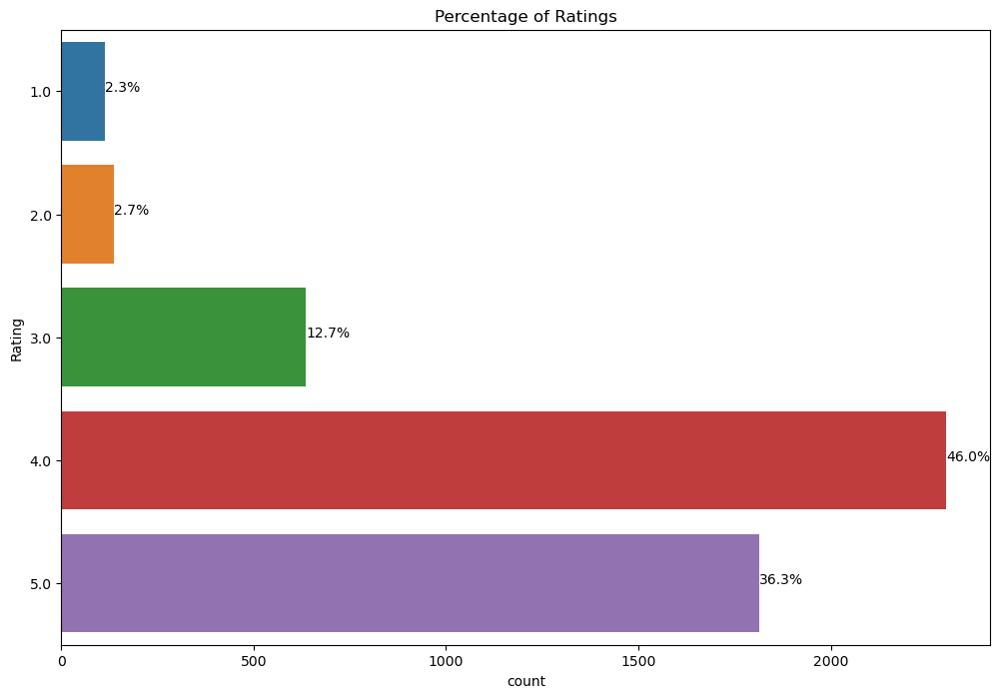

In [148]:
plt.figure(figsize=(12,8))
plt.title('Percentage of Ratings')
ax = sns.countplot(y = 'Rating', data = reviews)
total = len(reviews)
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

# Sentimental Analysis

In [149]:
data = df[['Review']]
data

,Review
0,I've purchased the 6GB version of this phone w...
1,I will try to keep this review short. This rev...
2,"Its good mobile to purchase, nice mobile , qua..."
3,"Phone is handy and light weight, OS is smooth,..."
4,Ya I like it let's see how long does it works
...,...
4995,NaN
4996,Disappointed as a one plus brand
4997,Superb sensors superb sound
4998,Overall good phone....but cost is little more ...


In [150]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
data['Review'] = data['Review'].apply(lambda x: " ".join(x.lower() for x in str(x).split() \
                                    if x not in stop_words))

In [151]:
data

,Review
0,i've purchased 6gb version phone comes extenda...
1,i try keep review short. this review perspecti...
2,"its good mobile purchase, nice mobile , qualit..."
3,"phone handy light weight, os smooth, front cam..."
4,ya i like let's see long works
...,...
4995,nan
4996,disappointed one plus brand
4997,superb sensors superb sound
4998,overall good phone....but cost little compared...


In [152]:
lemmatizer = WordNetLemmatizer()
# Removing punctuation, making str to lower, applying Lemmatizer, Removing Stop words
corpus=[]
for i in tqdm_notebook(range(0, len(data))):
    cleaned= re.sub('[^a-zA-Z]', " ", data["Review"][i])
    cleaned= cleaned.lower()
    cleaned = cleaned.split()
    cleaned= [lemmatizer.lemmatize(word) for word in cleaned if word not in stopwords.words("english")]
    cleaned= ' '.join(cleaned)
    corpus.append(cleaned)

  0%|          | 0/5000 [00:00<?, ?it/s]

In [153]:
#Saving cleaned data to compare with original data, to ckeck amount of information lost
dataframe = pd.DataFrame({"Clean_Reviews": corpus,"Uncleaned_Reviews": df.Review})
dataframe.head()

,Clean_Reviews,Uncleaned_Reviews
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua..."
3,phone handy light weight o smooth front camera...,"Phone is handy and light weight, OS is smooth,..."
4,ya like let see long work,Ya I like it let's see how long does it works


# Text pre processing

In [154]:
def remove_pattern(text, pattern_regex):
    r = re.findall(pattern_regex, text)
    for i in r:
        text = re.sub(i, '', text)
    
    return text 

In [155]:
# We are keeping cleaned tweets in a new column called 'tidy_tweets'
dataframe['Clean_Reviews'] = np.vectorize(remove_pattern)(dataframe['Clean_Reviews'], "@[\w]*")
dataframe.head(10)

,Clean_Reviews,Uncleaned_Reviews
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua..."
3,phone handy light weight o smooth front camera...,"Phone is handy and light weight, OS is smooth,..."
4,ya like let see long work,Ya I like it let's see how long does it works
5,good phone budget last year phone selling k co...,Very good phone in this budget. But last year ...
6,nyc performance battery backup good,Nyc performance & battery backup good
7,using day till experience good battery back av...,I have been using for only 3 days...till now e...
8,good mobile camera quality matching,"Over all good mobile, camera quality is not ma..."
9,awesome phone,Awesome 📱 Phone


In [156]:
#Removing links
cleaned_reviews = []

for index, row in dataframe.iterrows():
    # Here we are filtering out all the words that contains link
    words_without_links = [word for word in row.Clean_Reviews.split() if 'http' not in word]
    cleaned_reviews.append(' '.join(words_without_links))

dataframe['Clean_Reviews'] = cleaned_reviews
dataframe.head(10)

,Clean_Reviews,Uncleaned_Reviews
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua..."
3,phone handy light weight o smooth front camera...,"Phone is handy and light weight, OS is smooth,..."
4,ya like let see long work,Ya I like it let's see how long does it works
5,good phone budget last year phone selling k co...,Very good phone in this budget. But last year ...
6,nyc performance battery backup good,Nyc performance & battery backup good
7,using day till experience good battery back av...,I have been using for only 3 days...till now e...
8,good mobile camera quality matching,"Over all good mobile, camera quality is not ma..."
9,awesome phone,Awesome 📱 Phone


In [157]:
#Removing review with empty text
dataframe = dataframe[dataframe['Clean_Reviews']!='']
dataframe.head(10)

,Clean_Reviews,Uncleaned_Reviews
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua..."
3,phone handy light weight o smooth front camera...,"Phone is handy and light weight, OS is smooth,..."
4,ya like let see long work,Ya I like it let's see how long does it works
5,good phone budget last year phone selling k co...,Very good phone in this budget. But last year ...
6,nyc performance battery backup good,Nyc performance & battery backup good
7,using day till experience good battery back av...,I have been using for only 3 days...till now e...
8,good mobile camera quality matching,"Over all good mobile, camera quality is not ma..."
9,awesome phone,Awesome 📱 Phone


In [158]:
#dropping duplicate rows
dataframe.drop_duplicates(subset=['Clean_Reviews'], keep=False)
dataframe.head(10)

,Clean_Reviews,Uncleaned_Reviews
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua..."
3,phone handy light weight o smooth front camera...,"Phone is handy and light weight, OS is smooth,..."
4,ya like let see long work,Ya I like it let's see how long does it works
5,good phone budget last year phone selling k co...,Very good phone in this budget. But last year ...
6,nyc performance battery backup good,Nyc performance & battery backup good
7,using day till experience good battery back av...,I have been using for only 3 days...till now e...
8,good mobile camera quality matching,"Over all good mobile, camera quality is not ma..."
9,awesome phone,Awesome 📱 Phone


In [159]:
#Resetting index
dataframe = dataframe.reset_index(drop=True)
dataframe.head(10)


,Clean_Reviews,Uncleaned_Reviews
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua..."
3,phone handy light weight o smooth front camera...,"Phone is handy and light weight, OS is smooth,..."
4,ya like let see long work,Ya I like it let's see how long does it works
5,good phone budget last year phone selling k co...,Very good phone in this budget. But last year ...
6,nyc performance battery backup good,Nyc performance & battery backup good
7,using day till experience good battery back av...,I have been using for only 3 days...till now e...
8,good mobile camera quality matching,"Over all good mobile, camera quality is not ma..."
9,awesome phone,Awesome 📱 Phone


In [160]:
#removing punctuations number and special character
def clean_text(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [161]:
dataframe['Clean_Reviews'] = dataframe['Clean_Reviews'].apply(lambda x: clean_text(x))
dataframe.head(10)

,Clean_Reviews,Uncleaned_Reviews
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua..."
3,phone handy light weight o smooth front camera...,"Phone is handy and light weight, OS is smooth,..."
4,ya like let see long work,Ya I like it let's see how long does it works
5,good phone budget last year phone selling k co...,Very good phone in this budget. But last year ...
6,nyc performance battery backup good,Nyc performance & battery backup good
7,using day till experience good battery back av...,I have been using for only 3 days...till now e...
8,good mobile camera quality matching,"Over all good mobile, camera quality is not ma..."
9,awesome phone,Awesome 📱 Phone


In [162]:
#function to remove emoji
def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

In [163]:
dataframe['Clean_Reviews']=dataframe['Clean_Reviews'].apply(lambda x: remove_emoji(x))
dataframe.head(10)

,Clean_Reviews,Uncleaned_Reviews
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua..."
3,phone handy light weight o smooth front camera...,"Phone is handy and light weight, OS is smooth,..."
4,ya like let see long work,Ya I like it let's see how long does it works
5,good phone budget last year phone selling k co...,Very good phone in this budget. But last year ...
6,nyc performance battery backup good,Nyc performance & battery backup good
7,using day till experience good battery back av...,I have been using for only 3 days...till now e...
8,good mobile camera quality matching,"Over all good mobile, camera quality is not ma..."
9,awesome phone,Awesome 📱 Phone


In [164]:
dataframe['tokenized_tweets'] = dataframe['Clean_Reviews'].apply(lambda x: nltk.word_tokenize(x))
dataframe.head(10)

,Clean_Reviews,Uncleaned_Reviews,tokenized_tweets
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...,"[purchased, gb, version, phone, come, extendab..."
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...,"[try, keep, review, short, review, perspective..."
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua...","[good, mobile, purchase, nice, mobile, quality..."
3,phone handy light weight o smooth front camera...,"Phone is handy and light weight, OS is smooth,...","[phone, handy, light, weight, o, smooth, front..."
4,ya like let see long work,Ya I like it let's see how long does it works,"[ya, like, let, see, long, work]"
5,good phone budget last year phone selling k co...,Very good phone in this budget. But last year ...,"[good, phone, budget, last, year, phone, selli..."
6,nyc performance battery backup good,Nyc performance & battery backup good,"[nyc, performance, battery, backup, good]"
7,using day till experience good battery back av...,I have been using for only 3 days...till now e...,"[using, day, till, experience, good, battery, ..."
8,good mobile camera quality matching,"Over all good mobile, camera quality is not ma...","[good, mobile, camera, quality, matching]"
9,awesome phone,Awesome 📱 Phone,"[awesome, phone]"


In [165]:
dataframe.drop(['tokenized_tweets'],axis=1,inplace=True)

In [166]:
#Removing stop words
import codecs
with codecs.open(r"C:\Users\Devipriya M Rajesh\Documents\EXCELR\stop.txt", "r", encoding="ISO-8859-1") as s:
    stop = s.read()
    print(stop[:101])

a
a's
able
about
above
according
accordingly
across
actually
after
afterwards
again
again


In [167]:
stop.split(" ")

["a\r\na's\r\nable\r\nabout\r\nabove\r\naccording\r\naccordingly\r\nacross\r\nactually\r\nafter\r\nafterwards\r\nagain\r\nagainst\r\nain't\r\nall\r\nallow\r\nallows\r\nalmost\r\nalone\r\nalong\r\nalready\r\nalso\r\nalthough\r\nalways\r\nam\r\namong\r\namongst\r\nan\r\nand\r\nanother\r\nany\r\nanybody\r\nanyhow\r\nanyone\r\nanything\r\nanyway\r\nanyways\r\nanywhere\r\napart\r\nappear\r\nappreciate\r\nappropriate\r\nare\r\naren't\r\naround\r\nas\r\naside\r\nask\r\nasking\r\nassociated\r\nat\r\navailable\r\naway\r\nawfully\r\nb\r\nbe\r\nbecame\r\nbecause\r\nbecome\r\nbecomes\r\nbecoming\r\nbeen\r\nbefore\r\nbeforehand\r\nbehind\r\nbeing\r\nbelieve\r\nbelow\r\nbeside\r\nbesides\r\nbest\r\nbetter\r\nbetween\r\nbeyond\r\nboth\r\nbrief\r\nbut\r\nby\r\nc\r\nc'mon\r\nc's\r\ncame\r\ncan\r\ncan't\r\ncannot\r\ncant\r\ncause\r\ncauses\r\ncertain\r\ncertainly\r\nchanges\r\nclearly\r\nco\r\ncom\r\ncome\r\ncomes\r\nconcerning\r\nconsequently\r\nconsider\r\nconsidering\r\ncontain\r\ncontaining\r\nconta

In [168]:
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')
sw_list = [stop]
my_stop_words.extend(sw_list)
stopwords_set = set(my_stop_words)
cleaned_tweets = []

for index, row in dataframe.iterrows():
    
    # filerting out all the stopwords 
    words_without_stopwords = [word for word in row.Clean_Reviews.split() if not word in stopwords_set and '#' not in word.lower()]
    
    # finally creating tweets list of tuples containing stopwords(list) and sentimentType 
    cleaned_tweets.append(' '.join(words_without_stopwords))
    
dataframe['Clean_Reviews'] = cleaned_tweets
dataframe.head(10)

,Clean_Reviews,Uncleaned_Reviews
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua..."
3,phone handy light weight smooth front camera g...,"Phone is handy and light weight, OS is smooth,..."
4,ya like let see long work,Ya I like it let's see how long does it works
5,good phone budget last year phone selling k co...,Very good phone in this budget. But last year ...
6,nyc performance battery backup good,Nyc performance & battery backup good
7,using day till experience good battery back av...,I have been using for only 3 days...till now e...
8,good mobile camera quality matching,"Over all good mobile, camera quality is not ma..."
9,awesome phone,Awesome 📱 Phone


In [169]:
#Tokenize clean reviews
TextBlob(dataframe['Clean_Reviews'][1]).words

WordList(['try', 'keep', 'review', 'short', 'review', 'perspective', 'average', 'user', 'believe', 'buy', 'phone', 'start', 'use', 'change', 'adjust', 'without', 'complaining', 'much', 'always', 'better', 'device', 'price', 'use', 'tool', 'nothing', 'much', 'pro', 'camera', 'pretty', 'good', 'con', 'software', 'sweet', 'little', 'feature', 'one', 'plus', 'make', 'sweet', 'negative', 'speed', 'power', 'run', 'apps', 'people', 'use', 'generally', 'without', 'issue', 'build', 'quality', 'good', 'well', 'given', 'going', 'use', 'sort', 'case', 'con', 'con', 'see', 'battery', 'need', 'charge', 'twice', 'day', 'browse', 'internet', 'use', 'camera', 'time', 'watch', 'youtube', 'instagram', 'facebook', 'medium', 'apps', 'like', 'hour', 'two', 'mid', 'brightness', 'maximum', 'achievable', 'screen', 'time', 'around', 'hour', 'given', 'high', 'speed', 'charger', 'battery', 'really', 'issue', 'tweaking', 'around', 'setting', 'delete', 'preinstalled', 'apps', 'stop', 'unnecessary', 'apps', 'backgro

In [170]:
tokenized_review = dataframe['Clean_Reviews'].apply(lambda x: x.split())
tokenized_review.head(10)

0    [purchased, gb, version, phone, come, extendab...
1    [try, keep, review, short, review, perspective...
2    [good, mobile, purchase, nice, mobile, quality...
3    [phone, handy, light, weight, smooth, front, c...
4                     [ya, like, let, see, long, work]
5    [good, phone, budget, last, year, phone, selli...
6            [nyc, performance, battery, backup, good]
7    [using, day, till, experience, good, battery, ...
8            [good, mobile, camera, quality, matching]
9                                     [awesome, phone]
Name: Clean_Reviews, dtype: object

In [171]:
#converting words to stemmer
from nltk.stem.snowball import SnowballStemmer

# Use English stemmer.
stemmer = SnowballStemmer("english")

In [172]:
xx = pd.DataFrame()
xx['stemmed'] = dataframe['Clean_Reviews'].apply(lambda x: " ".join([stemmer.stem(word) for word in x.split()]))
xx

,stemmed
0,purchas gb version phone come extend gb ram vi...
1,tri keep review short review perspect averag u...
2,good mobil purchas nice mobil qualiti wise als...
3,phone handi light weight smooth front camera g...
4,ya like let see long work
...,...
4948,nan
4949,disappoint one plus brand
4950,superb sensor superb sound
4951,overal good phone cost littl compar phone spec...


In [173]:
#Converting words to Lemma
word_lemmatizer = WordNetLemmatizer()
nltk.download('omw-1.4')
yy=pd.DataFrame()
yy['stemmed'] = dataframe['Clean_Reviews'].apply(lambda x: " ".join([word_lemmatizer.lemmatize(i) for i in x.split()]))
yy

[nltk_data] Downloading package omw-1.4 to C:\Users\Devipriya M
[nltk_data]     Rajesh\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


,stemmed
0,purchased gb version phone come extendable gb ...
1,try keep review short review perspective avera...
2,good mobile purchase nice mobile quality wise ...
3,phone handy light weight smooth front camera g...
4,ya like let see long work
...,...
4948,nan
4949,disappointed one plus brand
4950,superb sensor superb sound
4951,overall good phone cost little compared phone ...


# Feature Extraction

In [174]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
tweetscv=cv.fit_transform(dataframe.Clean_Reviews)

In [175]:
print(cv.get_feature_names_out()[109:200])

['aggregation' 'agin' 'agni' 'ago' 'agree' 'ah' 'ahead' 'aheadof' 'ai'
 'aince' 'airtel' 'ak' 'aknh' 'al' 'alart' 'albeit' 'alert' 'alexa'
 'alignment' 'alike' 'allow' 'allram' 'allready' 'allright' 'allround'
 'allrounder' 'almost' 'alone' 'along' 'alot' 'already' 'alril' 'also'
 'alsothe' 'alspath' 'alternate' 'alternative' 'although' 'altogether'
 'always' 'ama' 'amaging' 'amaze' 'amazed' 'amazing' 'amazingcamera'
 'amazingly' 'amazingthis' 'amazon' 'amazone' 'amazonit' 'ambient'
 'amezing' 'amezingcharging' 'amezon' 'amh' 'amloiedover' 'ammolated'
 'amo' 'amoled' 'amolid' 'among' 'amount' 'amountand' 'ample' 'andar'
 'andbcamera' 'andif' 'andorid' 'android' 'androidbattery' 'androidfast'
 'andthe' 'angel' 'angle' 'angry' 'animation' 'announce' 'announcement'
 'announces' 'annoying' 'another' 'answer' 'answering' 'antutu' 'anurag'
 'anybody' 'anymore' 'anyone' 'anything' 'anytime']


In [176]:
print(cv.get_feature_names_out()[:100])

['aa' 'aacha' 'aaj' 'aand' 'aanouncementcamera' 'aap' 'aapko' 'aaplog'
 'aati' 'aaya' 'aayega' 'ab' 'abhi' 'able' 'abnd' 'abnormal' 'absence'
 'absent' 'absolutely' 'absolutelybut' 'absolutelynot' 'absurd' 'abt'
 'acalso' 'accept' 'acceptable' 'acceptablecamera' 'accepted' 'accepts'
 'access' 'accessible' 'accessing' 'accessory' 'accha' 'accidental'
 'accommodated' 'accomodate' 'accomplished' 'according' 'accordingbrand'
 'account' 'accurate' 'acha' 'achcha' 'achchha' 'achchhi' 'ache' 'achha'
 'achhe' 'achhi' 'achi' 'achievable' 'achieve' 'achieved' 'across' 'act'
 'action' 'activate' 'activated' 'activates' 'activity' 'actual'
 'actually' 'ad' 'adamant' 'adapter' 'adaption' 'adaptive' 'adaptor' 'add'
 'added' 'addict' 'addicted' 'adding' 'addition' 'additional' 'address'
 'adequate' 'adjust' 'adjusted' 'adjusting' 'adjustment' 'admit' 'adopted'
 'adopter' 'adoptor' 'advance' 'advanced' 'advantage' 'adventurous'
 'advertised' 'advertising' 'advice' 'advise' 'aesthetic' 'aesthetically'


In [177]:
print(tweetscv.toarray()[100:200])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [178]:
#Countvectorizer with N-grams
from nltk.corpus import stopwords
ps = PorterStemmer()
corpus = []
for i in tqdm_notebook(range(0, len(dataframe))):
    review = re.sub('[^a-zA-Z]', ' ', dataframe['Clean_Reviews'][i])
    review = review.lower()
    review = review.split()
    
    review = [ps.stem(word) for word in review if not word in stopwords.words('english')]
    review = ' '.join(review)
    corpus.append(review)

  0%|          | 0/4953 [00:00<?, ?it/s]

In [179]:
corpus[3]

'phone handi light weight smooth front camera good main camera qualiti good'

In [180]:
## Applying Countvectorizer
# Creating the Bag of Words model
cv = CountVectorizer(max_features=5000,ngram_range=(1,3))
X = cv.fit_transform(corpus).toarray()

In [181]:
X.shape

(4953, 5000)

In [182]:
cv.get_feature_names_out()[:20]

array(['aacha', 'aap', 'ab', 'abl', 'abl use', 'absenc', 'absenc amol',
       'absent', 'absolut', 'accept', 'access', 'accessori', 'accha',
       'accord', 'accord price', 'account', 'accur', 'acha', 'acha phone',
       'achha'], dtype=object)

In [183]:
cv.get_params()

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.int64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 1.0,
 'max_features': 5000,
 'min_df': 1,
 'ngram_range': (1, 3),
 'preprocessor': None,
 'stop_words': None,
 'strip_accents': None,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'vocabulary': None}

In [184]:
count_df = pd.DataFrame(X, columns=cv.get_feature_names_out())
count_df

,aacha,aap,ab,abl,abl use,absenc,absenc amol,absent,absolut,accept,...,yellow,yesterday,yet,youtub,youtub instagram,youtub review,youtub video,yr,zero,zoom
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4948,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4949,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4950,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4951,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# TF-IDF vectorizer

In [185]:
from nltk.corpus import stopwords
ps = PorterStemmer()
corpus = []
for i in tqdm_notebook(range(0, len(dataframe))):
    review = re.sub('[^a-zA-Z]', ' ', dataframe['Clean_Reviews'][i])
    review = review.lower()
    review = review.split()
    
    review = [ps.stem(word) for word in review if not word in stopwords.words('english')]
    review = ' '.join(review)
    corpus.append(review)

  0%|          | 0/4953 [00:00<?, ?it/s]

In [186]:
corpus[4]

'ya like let see long work'

In [187]:
## TFidf Vectorizer
tfidf_v=TfidfVectorizer(max_features=5000,ngram_range=(1,3))
X=tfidf_v.fit_transform(corpus).toarray()

In [188]:
tfidf_v.get_feature_names_out()[:20]

array(['aacha', 'aap', 'ab', 'abl', 'abl use', 'absenc', 'absenc amol',
       'absent', 'absolut', 'accept', 'access', 'accessori', 'accha',
       'accord', 'accord price', 'account', 'accur', 'acha', 'acha phone',
       'achha'], dtype=object)

In [189]:
tfidf_v.get_params()

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.float64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 1.0,
 'max_features': 5000,
 'min_df': 1,
 'ngram_range': (1, 3),
 'norm': 'l2',
 'preprocessor': None,
 'smooth_idf': True,
 'stop_words': None,
 'strip_accents': None,
 'sublinear_tf': False,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'use_idf': True,
 'vocabulary': None}

In [190]:
count_df = pd.DataFrame(X, columns=tfidf_v.get_feature_names_out())
count_df

,aacha,aap,ab,abl,abl use,absenc,absenc amol,absent,absolut,accept,...,yellow,yesterday,yet,youtub,youtub instagram,youtub review,youtub video,yr,zero,zoom
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.076289,0.101351,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4948,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
4949,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
4950,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
4951,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


In [191]:
reviews=[review.strip() for review in dataframe.Clean_Reviews] # remove both the leading and the trailing characters
reviews=[comment for comment in reviews if comment] # removes empty strings, because they are considered in Python as False
# Joining the list into one string/text
reviews_text=' '.join(reviews)
reviews_text[0:1000]

'purchased gb version phone come extendable gb ram virtual memory capability good phone least expensive category offering one plus small evident point get noticed first thing confusing placement power button hence finger sensor daily handling mobile phone feel bit annoying finger locking un locking phone try handle place pocket although big problem still something think second point lag noticeable bit hoping might go away update improvement third point speaker volume speaker good near maximum level e volume seem creep steadily rather louds top volume limit fourth point final one camera shoot color realistic photo taken day light especially skin tone tend coloured led flash average could better good awesome part phone practicality daily user one plus strong brand part pricing offered battery life good charging capability also impressive someone like moved android phone build phone apt survive normal fall mishap happening phone feel solid hand stock android clean nothing complain overall

In [192]:
#Fetch sentiments
# 1 way
def fetch_sentiment_using_SIA(text):
    sid = SentimentIntensityAnalyzer()
    polarity_scores = sid.polarity_scores(text)
    return 'neg' if polarity_scores['neg'] > polarity_scores['pos'] else 'pos'

# 2 way
def fetch_sentiment_using_textblob(text):
    analysis = TextBlob(text)
    return 'pos' if analysis.sentiment.polarity >= 0 else 'neg'


In [203]:
sentiments_using_SIA = dataframe.Clean_Reviews.apply(lambda tweet: fetch_sentiment_using_SIA(tweet))
pd.DataFrame(sentiments_using_SIA.value_counts())

,Clean_Reviews
pos,4535
neg,418


In [204]:
dataframe.Clean_Reviews[8]

'good mobile camera quality matching'

In [205]:
sid = SentimentIntensityAnalyzer()
sid.polarity_scores(dataframe.Clean_Reviews[8])

{'neg': 0.0, 'neu': 0.58, 'pos': 0.42, 'compound': 0.4404}

In [206]:
df=pd.DataFrame()
df['Review'] = dataframe.Clean_Reviews
df['scores'] = dataframe['Clean_Reviews'].apply(lambda review: sid.polarity_scores(review))
df.head()

,Review,scores
0,purchased gb version phone come extendable gb ...,"{'neg': 0.069, 'neu': 0.684, 'pos': 0.247, 'co..."
1,try keep review short review perspective avera...,"{'neg': 0.043, 'neu': 0.704, 'pos': 0.253, 'co..."
2,good mobile purchase nice mobile quality wise ...,"{'neg': 0.0, 'neu': 0.506, 'pos': 0.494, 'comp..."
3,phone handy light weight smooth front camera g...,"{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'comp..."
4,ya like let see long work,"{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'comp..."


In [207]:
df['compound']  = df['scores'].apply(lambda scores: scores['compound'])
df.head()

,Review,scores,compound
0,purchased gb version phone come extendable gb ...,"{'neg': 0.069, 'neu': 0.684, 'pos': 0.247, 'co...",0.9876
1,try keep review short review perspective avera...,"{'neg': 0.043, 'neu': 0.704, 'pos': 0.253, 'co...",0.9776
2,good mobile purchase nice mobile quality wise ...,"{'neg': 0.0, 'neu': 0.506, 'pos': 0.494, 'comp...",0.8934
3,phone handy light weight smooth front camera g...,"{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'comp...",0.7003
4,ya like let see long work,"{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'comp...",0.3612


In [208]:
df['sentiment'] = df['compound'].apply(lambda c: 'Positive' if c >=0.05 else ('Negative' if c<=-0.05  else 'Neutral'))
df

,Review,scores,compound,sentiment
0,purchased gb version phone come extendable gb ...,"{'neg': 0.069, 'neu': 0.684, 'pos': 0.247, 'co...",0.9876,Positive
1,try keep review short review perspective avera...,"{'neg': 0.043, 'neu': 0.704, 'pos': 0.253, 'co...",0.9776,Positive
2,good mobile purchase nice mobile quality wise ...,"{'neg': 0.0, 'neu': 0.506, 'pos': 0.494, 'comp...",0.8934,Positive
3,phone handy light weight smooth front camera g...,"{'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'comp...",0.7003,Positive
4,ya like let see long work,"{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'comp...",0.3612,Positive
...,...,...,...,...
4948,nan,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neutral
4949,disappointed one plus brand,"{'neg': 0.508, 'neu': 0.492, 'pos': 0.0, 'comp...",-0.4767,Negative
4950,superb sensor superb sound,"{'neg': 0.0, 'neu': 0.196, 'pos': 0.804, 'comp...",0.8481,Positive
4951,overall good phone cost little compared phone ...,"{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'comp...",0.4404,Positive


In [209]:
from collections import defaultdict
from plotly import tools
from plotly.offline import iplot
#Filtering data
positive_review = df[df["sentiment"]=='Positive'].dropna()
neutral_review = df[df["sentiment"]=='Neutral'].dropna()
negative_review = df[df["sentiment"]=='Negative'].dropna()

## custom function for ngram generation ##
def generate_ngrams(text, n_gram = 1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in stop]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

# custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y =df["word"].values[::-1],
        x = df["wordcount"].values[::-1],
        showlegend = False,
        orientation = 'h',
        marker = dict(
            color = color,
        ),
    )
    return trace

## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in positive_review["Review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(20), 'blue')


## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in neutral_review["Review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(20), 'purple')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in negative_review["Review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(20), 'yellow')

# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing = 0.04,
                          subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral reviews",
                                          "Frequent words of negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
iplot(fig, filename='word-plots')

In [210]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings("ignore")


type_ = ["Positive", "Neutral", "Negative"]
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Pie(labels=type_, values=df['sentiment'].value_counts(), name="sentiment"))

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Sentiment Analysis",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Sentiment', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()

<Axes: xlabel='sentiment', ylabel='count'>

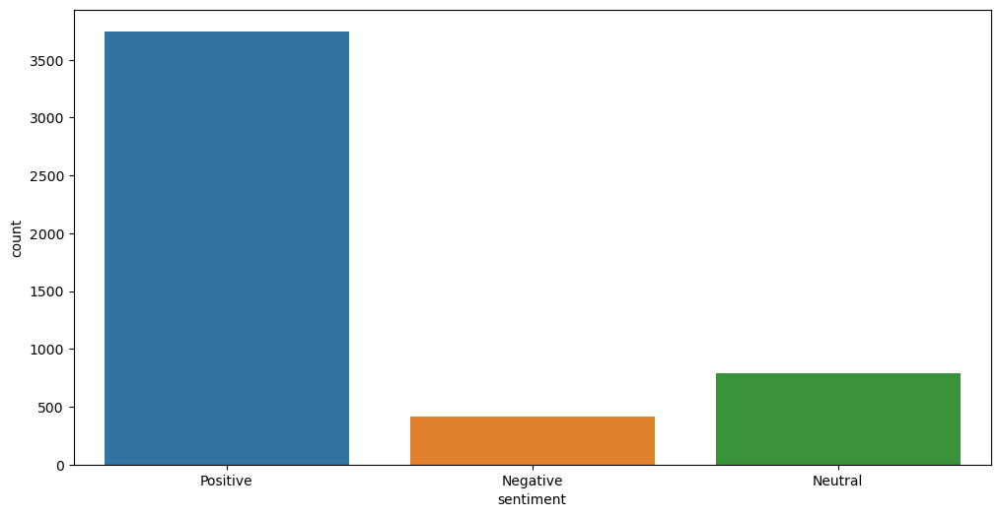

In [211]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df)

<Axes: xlabel='compound', ylabel='Density'>

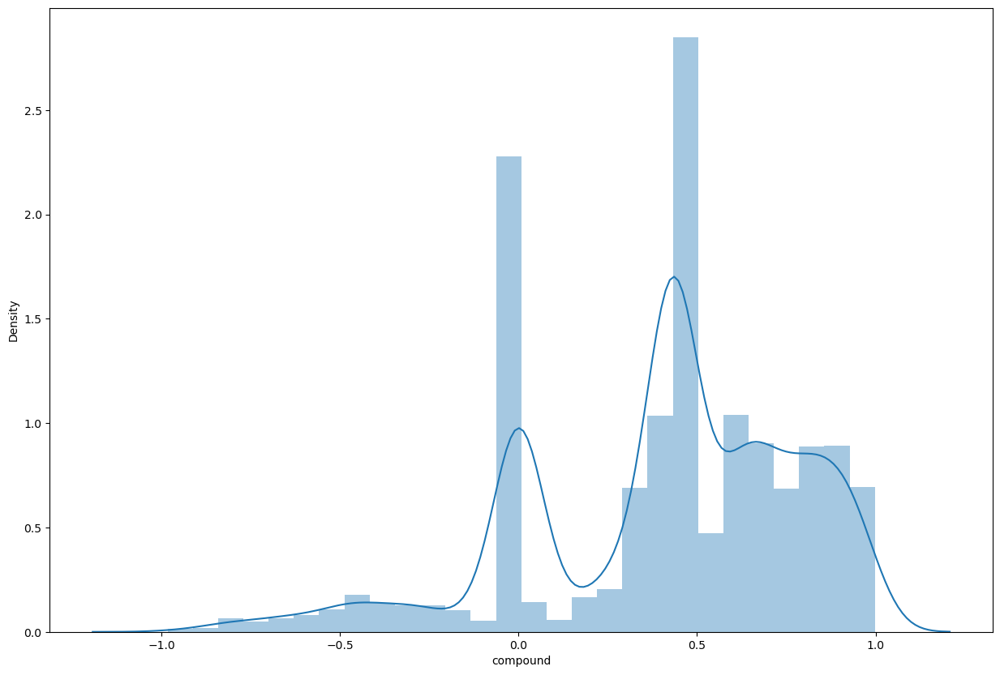

In [212]:
# Plotting the sentiment value for whole review
import seaborn as sns
plt.figure(figsize=(15,10))
sns.distplot(df['compound'])

In [221]:
dataframe['sentiment'] = sentiments_using_SIA
dataframe.to_csv(r"C:\Users\Devipriya M Rajesh\Documents\EXCELR\clean_review.csv",index=False)
dataframe.head()

,Clean_Reviews,Uncleaned_Reviews,sentiment
0,purchased gb version phone come extendable gb ...,I've purchased the 6GB version of this phone w...,pos
1,try keep review short review perspective avera...,I will try to keep this review short. This rev...,pos
2,good mobile purchase nice mobile quality wise ...,"Its good mobile to purchase, nice mobile , qua...",pos
3,phone handy light weight smooth front camera g...,"Phone is handy and light weight, OS is smooth,...",pos
4,ya like let see long work,Ya I like it let's see how long does it works,pos


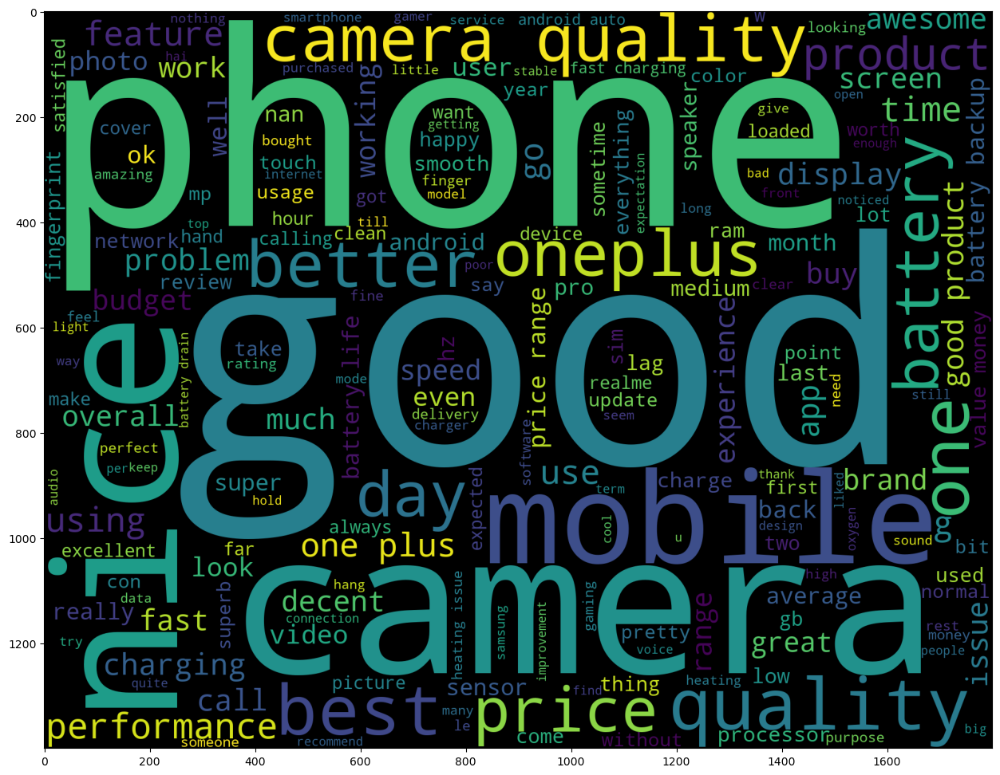

In [215]:
allWords_ = ' '.join([review for review in dataframe[:500]['Clean_Reviews']])
f, axes = plt.subplots(figsize=(20,12))
wordcloud= WordCloud(
        background_color = 'black',
        width = 1800,
        height =1400).generate(allWords_)
plt.imshow(wordcloud)

In [223]:
def generate_wordcloud(all_words):
    wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=100, relative_scaling=0.5, colormap='Dark2').generate(all_words)

    plt.figure(figsize=(14, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

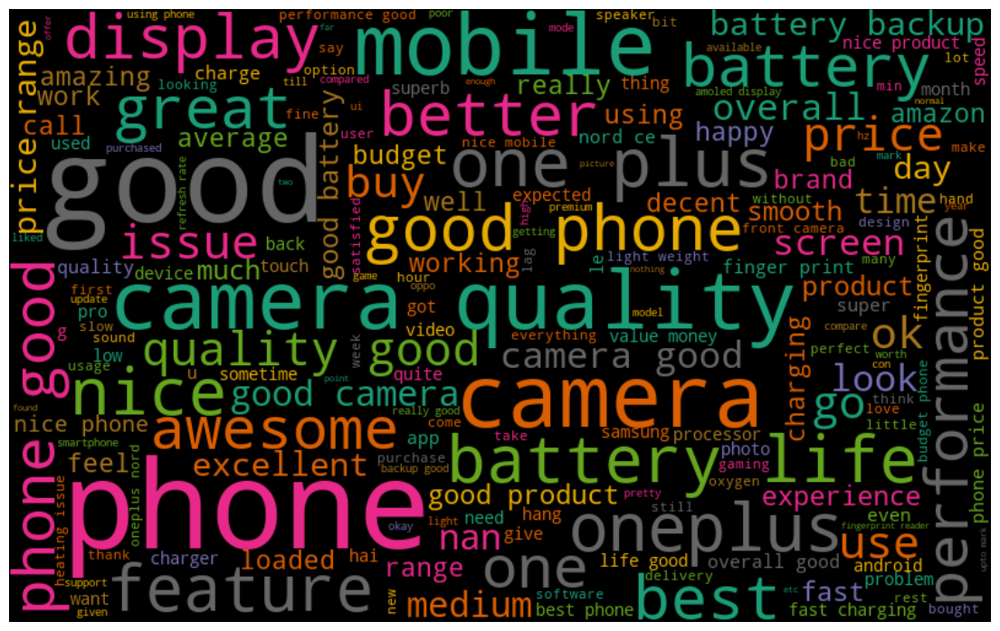

In [224]:
#Most common words in positive Review
all_words = ' '.join([text for text in dataframe['Clean_Reviews'][dataframe.sentiment == 'pos']])
generate_wordcloud(all_words)

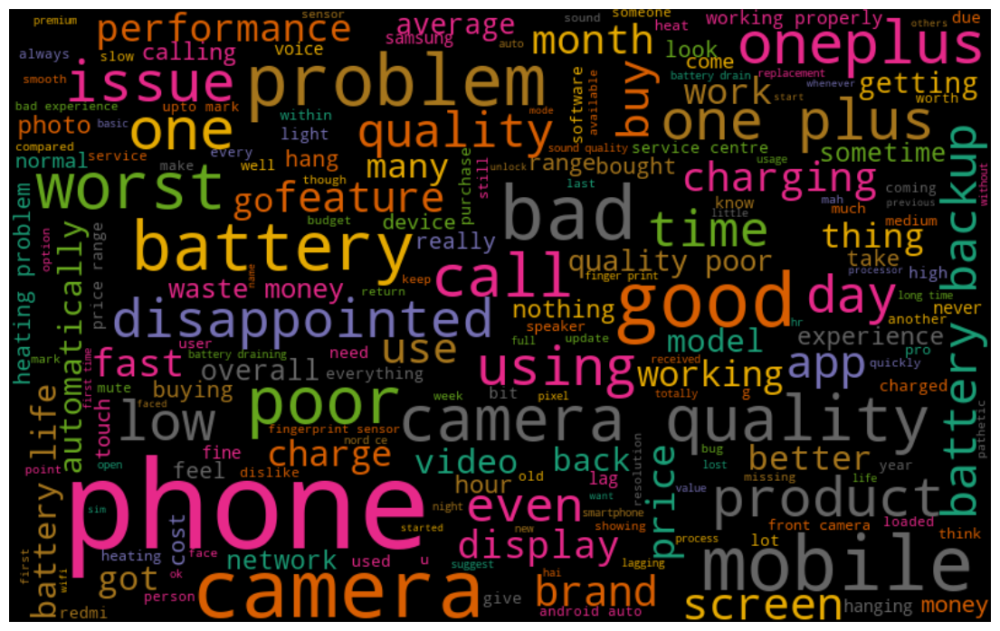

In [225]:
#Most common words in negative Review
all_words = ' '.join([text for text in dataframe['Clean_Reviews'][dataframe.sentiment == 'neg']])
generate_wordcloud(all_words)